In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

%matplotlib inline
import os
import math


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
import warnings
warnings.filterwarnings("ignore")

# these two lines are what allow your code to show up in a notebook!
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=False)
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/covid19-global-dataset/worldometer_coronavirus_daily_data.csv
/kaggle/input/covid19-global-dataset/worldometer_coronavirus_summary_data.csv
/kaggle/input/covid-world-vaccination-progress/country_vaccinations_by_manufacturer.csv
/kaggle/input/covid-world-vaccination-progress/country_vaccinations.csv


# **What is Covid-19?**
Coronaviruses are a group of related RNA viruses that cause diseases in mammals and birds. In humans and birds, they cause respiratory tract infections that can range from mild to lethal. Coronavirus disease(COVID-19) is the infectious disease caused by the most recently discovered coronavirus. The best way to prevent and slow down transmission is to be well informed about the COVID-19 virus, the disease it causes and how it spreads. Protect yourself and others from infection by washing your hands or using an alcohol based rub frequently and not touching your face.   

**Note:** The main aim of this kernel is not to dig deeper into where and how fast corona virus is spreading. It isn't to extensively study the havoc wreaked by the coronavirus in different countries either. Rather, it is to understand the extent of the spread and notice how vaccinations are helping us ease it down. It is to educate all and sundry about the importance of vaccinations with regard to Covid-19. 

Hence, I'll focus on the subject of vaccination.

I shall begin this EDA by peeking through the two datasets in the [covid-19-global-dataset](https://www.kaggle.com/josephassaker/covid19-global-dataset?select=worldometer_coronavirus_daily_data.csv). This is to be aware of the current active cases and the rate of transfer of the coronavirus right from the very start. 

In [2]:
df = pd.read_csv('/kaggle/input/covid19-global-dataset/worldometer_coronavirus_daily_data.csv')
df

,date,country,cumulative_total_cases,daily_new_cases,active_cases,cumulative_total_deaths,daily_new_deaths
0,2020-2-15,Afghanistan,0.0,NaN,0.0,0.0,NaN
1,2020-2-16,Afghanistan,0.0,NaN,0.0,0.0,NaN
2,2020-2-17,Afghanistan,0.0,NaN,0.0,0.0,NaN
3,2020-2-18,Afghanistan,0.0,NaN,0.0,0.0,NaN
4,2020-2-19,Afghanistan,0.0,NaN,0.0,0.0,NaN
...,...,...,...,...,...,...,...
99459,2021-5-07,Zimbabwe,38403.0,5.0,786.0,1576.0,1.0
99460,2021-5-08,Zimbabwe,38414.0,11.0,786.0,1576.0,0.0
99461,2021-5-09,Zimbabwe,38419.0,5.0,780.0,1576.0,0.0
99462,2021-5-10,Zimbabwe,38433.0,14.0,649.0,1576.0,0.0


In [3]:
df_summary = pd.read_csv('/kaggle/input/covid19-global-dataset/worldometer_coronavirus_summary_data.csv')
df_summary

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population
0,Afghanistan,Asia,62718,2713.0,54503,5502,1124.0,1581,68.0,425056.0,10713.0,39676986
1,Albania,Europe,131803,2420.0,119061,10322,18.0,45843,842.0,657917.0,228833.0,2875093
2,Algeria,Africa,124483,3343.0,86703,34437,28.0,2796,75.0,230861.0,5185.0,44528314
3,Andorra,Europe,13447,127.0,13070,250,12.0,173799,1641.0,193595.0,2502165.0,77371
4,Angola,Africa,29146,639.0,25145,3362,20.0,864,19.0,527590.0,15639.0,33736498
...,...,...,...,...,...,...,...,...,...,...,...,...
215,Wallis And Futuna Islands,Australia/Oceania,445,7.0,44,394,1.0,40202,632.0,17264.0,1559671.0,11069
216,Western Sahara,Africa,10,1.0,8,1,NaN,16,2.0,NaN,NaN,609870
217,Yemen,Asia,6492,1276.0,3003,2213,23.0,214,42.0,34287.0,1128.0,30387003
218,Zambia,Africa,92152,1258.0,90539,355,42.0,4896,67.0,1448213.0,76940.0,18822708


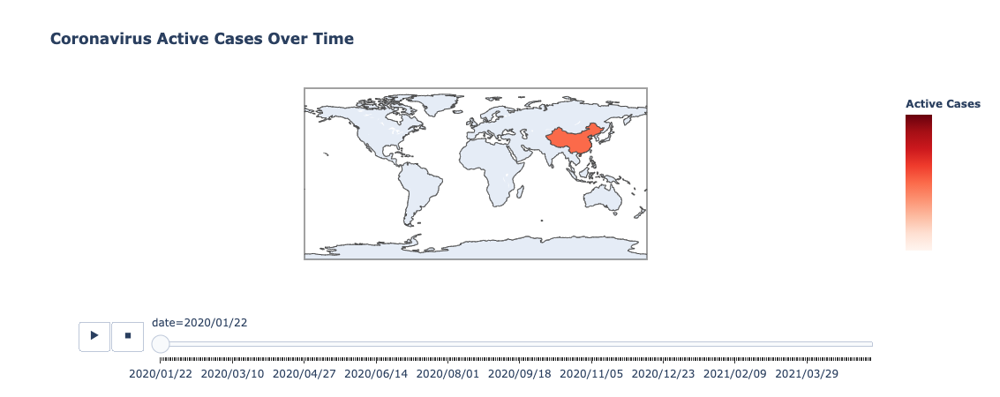

In [4]:
df['date'] = pd.to_datetime(df.date, format='%Y/%m/%d')
df['date'] = df['date'].dt.strftime('%Y/%m/%d')
active_cases_df = df[['date', 'country', 'active_cases']].dropna().sort_values('date')
active_cases_df = active_cases_df[active_cases_df.active_cases > 0]
active_cases_df['log2(active_cases)'] = np.log2(active_cases_df['active_cases'])

log_scale_vals = list(range(0,25,2))
scale_vals = (np.exp2(log_scale_vals)).astype(int).astype(str)

fig = px.choropleth(active_cases_df, locations="country", locationmode='country names',
                    color="log2(active_cases)", hover_name="country", hover_data=['active_cases'],
                    projection="natural earth", animation_frame="date",
                    title='<b>Coronavirus Active Cases Over Time</b>',
                    color_continuous_scale="reds",
                   )

fig.update_layout(coloraxis={"colorbar": {"title":"<b>Active Cases</b><br>",
                                          "titleside":"top",
                                          "tickmode":"array",
                                          "tickvals":log_scale_vals,
                                          "ticktext":scale_vals}
                            }
                 )
fig.update_geos(projection_type="equirectangular", visible=True, resolution=110)
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 10
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 2
fig.show()

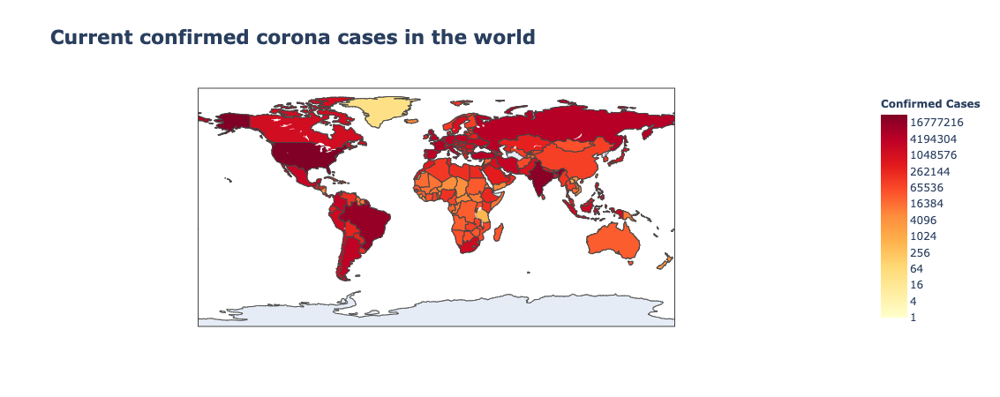

In [5]:
df_summary['log(Total Confirmed)'] = np.log2(df_summary['total_confirmed'])
df_summary['Total Confirmed'] = df_summary['total_confirmed']

fig = px.choropleth(df_summary,
                    locations="country",
                    color="log(Total Confirmed)",
                    locationmode = 'country names',
                    hover_name='country',
                    hover_data=['Total Confirmed'],
                    color_continuous_scale= "ylorrd" ,
                    title = '<b>Current confirmed corona cases in the world</b>')


log_scale_vals = list(range(0,25,2))
scale_vals = (np.exp2(log_scale_vals)).astype(int).astype(str)



fig.update_layout(title_font_size=22,
                  margin={"r":20, "l":20},
                  coloraxis={#"showscale":False,
                            "colorbar":dict(title="<b>Confirmed Cases</b><br>",
                                            #range=[np.log(50), np.log(6400)],
                                            titleside="top",
                                            tickmode="array",
                                            tickvals=log_scale_vals,
                                            ticktext=scale_vals
                                        )},
                 )

fig.show()

I've used chloropleth maps to portray the spread of coronavirus chronologically and globally. I've used a steady yet stagnant chloropleth to display the current active cases all over the world. Pretty self-descriptive, eh?

Now that we've been briefed on the situation, let's learn how we can tackle this. 

# **Vaccination Progress**

The dataset contains the following information:

* **Country** - this is the country for which the vaccination information is provided;
* **Country ISO Code** - ISO code for the country;
* **Date**- date for the data entry; for some of the dates we have only the daily vaccinations, for others, only the (cumulative) total;
* **Total number of vaccinations** - this is the absolute number of total immunizations in the country;
* **Total number of people vaccinated** - a person, depending on the immunization scheme, will receive one or more (typically 2) vaccines; at a certain moment, the number of vaccination might be larger than the number of people;
* **Total number of people fully vaccinated** - this is the number of people that received the entire set of immunization according to the immunization scheme (typically 2); at a certain moment in time, there might be a certain number of people that received one vaccine and another number (smaller) of people that received all vaccines in the scheme;
* **Daily vaccinations (raw)** - for a certain data entry, the number of vaccination for that date/country;
* **Daily vaccinations** - for a certain data entry, the number of vaccination for that date/country;
* **Total vaccinations per hundred** - ratio (in percent) between vaccination number and total population up to the date in the country;
* **Total number of people vaccinated per hundred** - ratio (in percent) between population immunized and total population up to the date in the country;
* **Total number of people fully vaccinated per hundred** - ratio (in percent) between population fully immunized and total population up to the date in the country;
* **Number of vaccinations per day** - number of daily vaccination for that day and country;
* **Daily vaccinations per million** - ratio (in ppm) between vaccination number and total population for the current date in the country;
* **Vaccines used in the country** - total number of vaccines used in the country (up to date);
* **Source name** - source of the information (national authority, international organization, local organization etc.);
* **Source website** - website of the source of information;

In [6]:
country_vaccinations =  pd.read_csv('../input/covid-world-vaccination-progress/country_vaccinations.csv')
country_vaccinations.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/


In [7]:
country_vaccinations.shape

(17607, 15)

In [8]:
country_vaccinations.columns

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')

In [9]:
country_vaccinations.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
count,1.025100e+04,9.526000e+03,7.185000e+03,8.568000e+03,1.739100e+04,10251.000000,9526.000000,7185.000000,17391.000000
mean,5.716299e+06,3.500000e+06,1.817309e+06,1.445607e+05,7.941384e+04,17.199317,12.341277,6.403328,3031.492094
std,2.399767e+07,1.313534e+07,7.875693e+06,5.906624e+05,3.837504e+05,24.719775,16.087866,10.620806,4639.012478
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,6.450950e+04,5.595875e+04,2.520600e+04,3.176000e+03,8.520000e+02,1.500000,1.390000,0.700000,355.000000
50%,4.701090e+05,3.617215e+05,1.920300e+05,1.674100e+04,5.974000e+03,7.170000,5.620000,2.670000,1523.000000
75%,2.154874e+06,1.491252e+06,7.725270e+05,6.590250e+04,3.005350e+04,22.565000,17.017500,7.470000,4122.500000
max,3.669100e+08,1.546242e+08,1.189873e+08,1.263800e+07,9.882286e+06,220.400000,114.950000,105.460000,118759.000000


In [10]:
country_vaccinations.dtypes

country                                 object
iso_code                                object
date                                    object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
daily_vaccinations_raw                 float64
daily_vaccinations                     float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
daily_vaccinations_per_million         float64
vaccines                                object
source_name                             object
source_website                          object
dtype: object

In [11]:
country_vaccinations["date"]= pd.to_datetime(country_vaccinations.date)

# 1. How many people are vaccinated in each country?

In [12]:
country_vaccinations["people_vaccinated"]= country_vaccinations.groupby("country").total_vaccinations.tail(1)
country_vaccinations.groupby("country")["people_vaccinated"].mean().sort_values(ascending= False).head(15)

country
China             366910000.0
United States     266596486.0
India             178361846.0
United Kingdom     54797640.0
Brazil             50308106.0
England            45908796.0
Germany            38646171.0
France             27455748.0
Italy              25948925.0
Turkey             25402277.0
Russia             22782931.0
Indonesia          22617205.0
Mexico             21986456.0
Spain              21071940.0
Canada             17297879.0
Name: people_vaccinated, dtype: float64

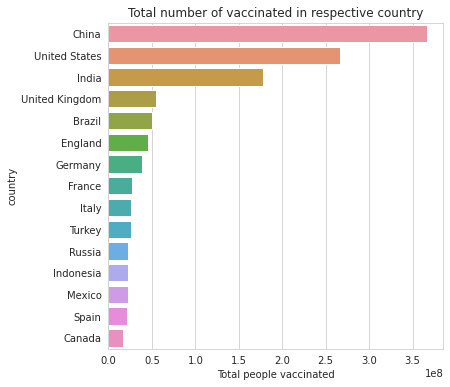

In [13]:
country_vaccinations["people_vaccinated"]= country_vaccinations.groupby("country").total_vaccinations.tail(1)
x = country_vaccinations.groupby("country")["people_vaccinated"].mean().sort_values(ascending= False).head(15)
sns.set_style("whitegrid")
plt.figure(figsize= (6,6))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Total people vaccinated")
plt.title("Total number of vaccinated in respective country")
plt.show()

In [14]:
country_vaccinations["Total_vaccinations(count)"]= country_vaccinations.groupby("country").total_vaccinations.tail(1)
country_vaccinations.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(10)

country
China             366910000.0
United States     266596486.0
India             178361846.0
United Kingdom     54797640.0
Brazil             50308106.0
England            45908796.0
Germany            38646171.0
France             27455748.0
Italy              25948925.0
Turkey             25402277.0
Name: Total_vaccinations(count), dtype: float64

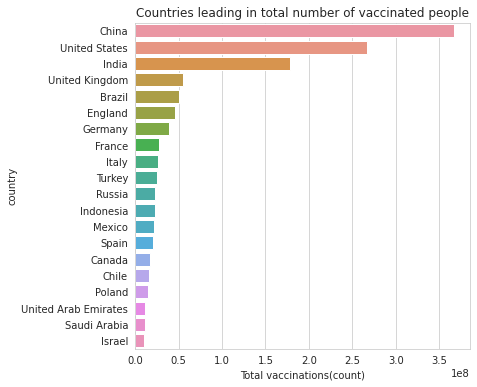

In [15]:
country_vaccinations["Total_vaccinations(count)"]= country_vaccinations.groupby("country").total_vaccinations.tail(1)
x = country_vaccinations.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("whitegrid")
plt.figure(figsize= (6,6))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Total vaccinations(count)")
ax.set_title("Countries leading in total number of vaccinated people")
plt.show()

Since the number of total vaccinations and the people vaccinated as of today match, we can confirm that China, USA and India are the leading countries in having their citizens vaccinated.

# 2. Which countries have the most number of fully vaccinated people?

In [16]:
num_people_fully_vaccinated = country_vaccinations.groupby(['country'])['people_fully_vaccinated'].max().sort_values(ascending = False).head(15)
num_people_fully_vaccinated.sort_values(ascending = False)

country
United States     118987308.0
India              39274256.0
United Kingdom     18890969.0
Brazil             16215378.0
England            15935683.0
Turkey             10669750.0
Mexico              9861173.0
Russia              9129433.0
Indonesia           8919949.0
Germany             8822370.0
France              8632406.0
Italy               8079257.0
Chile               7374467.0
Spain               6716156.0
Israel              5094242.0
Name: people_fully_vaccinated, dtype: float64

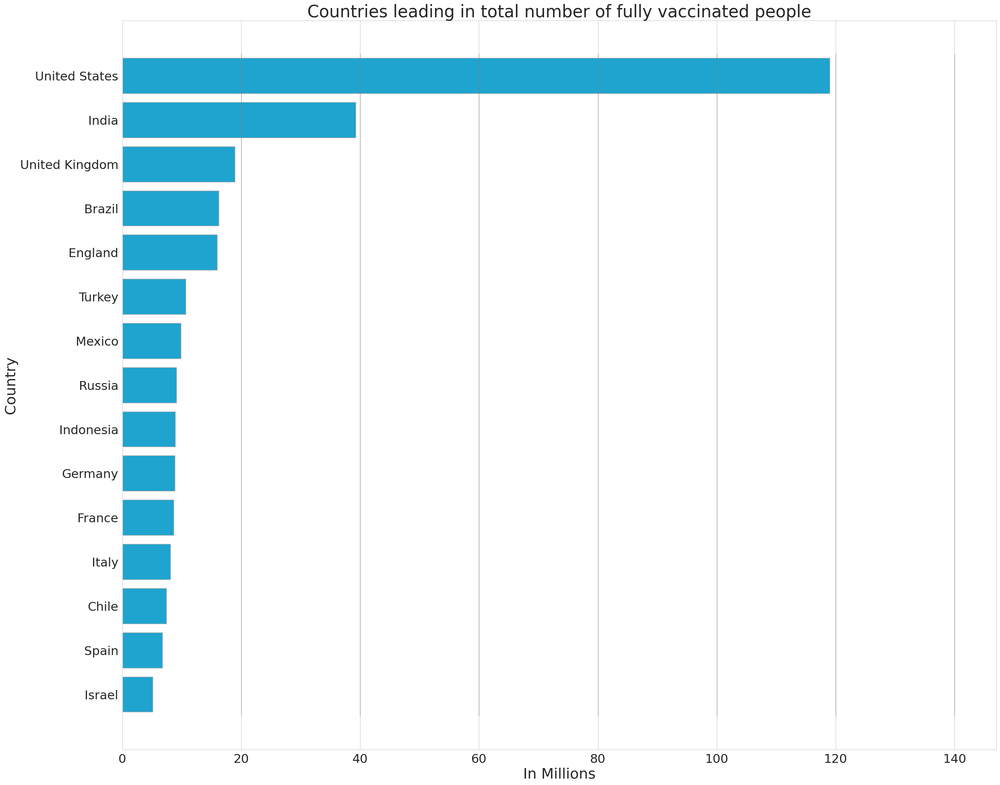

In [17]:
fig, ax = plt.subplots(ncols=1, nrows=1, dpi=100, figsize=(28,24))
num_people_fully_vaccinated = country_vaccinations.groupby(['country'])['people_fully_vaccinated'].max().sort_values(ascending = False).head(15)
num_people_fully_vaccinated.sort_values(ascending = False)
sns.barplot(x=num_people_fully_vaccinated.values, y=num_people_fully_vaccinated.index, color= '#00b3ec', edgecolor='darkgrey')
ax.tick_params(axis='y', labelsize=22)
ax.set_xticklabels([0,20,40,60,80,100,120,140], fontsize=22)
ax.set_ylabel("Country",fontsize = 26)
ax.set_xlabel("In Millions",fontsize = 26)
for label in ax.yaxis.get_ticklabels():
            label.wrap=True
Ystart, Yend = ax.get_ylim()
ax.vlines(x=[20e6,40e6,60e6,80e6,100e6, 120e6,140e6],
             ymin=Ystart, ymax=Yend,  color='gray', linewidth = 0.7)
ax.set_title("Countries leading in total number of fully vaccinated people", fontsize=30)
plt.show()

# 3. What's the trend noticed when comparing date with daily vaccinations?

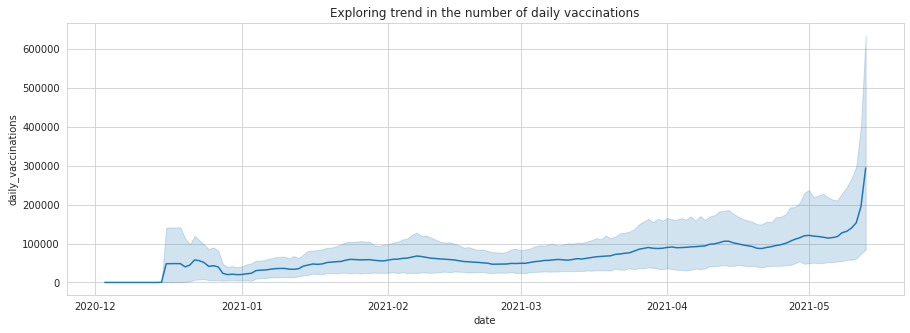

In [18]:
plt.figure(figsize= (15,5))
sns.lineplot(x= "date",y= "daily_vaccinations",data= country_vaccinations)
plt.title("Exploring trend in the number of daily vaccinations")
plt.show()

We, very clearly, see an increase in the number of daily vaccinations. And this increase is definitely commendable! 

# 4. a) Total vaccinations in India

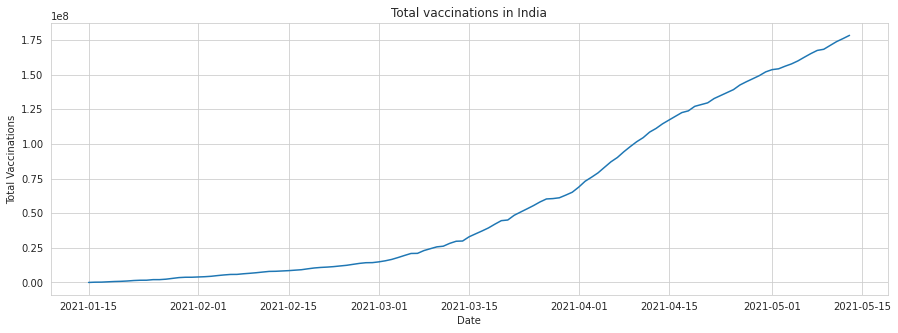

In [19]:
plt.figure(figsize= (15,5))
plt.xlabel("Date")
plt.ylabel("Total Vaccinations")
plt.title("Total vaccinations in India")
sns.lineplot(x= "date",y= "total_vaccinations",data= country_vaccinations[country_vaccinations["country"]=="India"])
plt.show()

# 4. b) Daily vaccinations in India

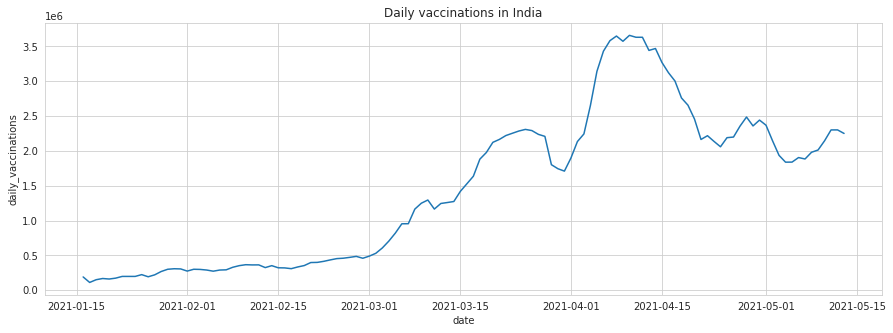

In [20]:
plt.figure(figsize= (15,5))

sns.lineplot(x= "date",y= "daily_vaccinations",data= country_vaccinations[country_vaccinations.country== "India"])
plt.title("Daily vaccinations in India")
plt.show()

A conclusion with regard to this plot is that there is definitely a noticeable increase in the number of vaccines administered in India. Sadly, there is no age group mentioned in this dataset else that would have been an option to explore as well. Health officials said that an increase in awareness and fear of the second wave has made people go for vaccination. They said that the number of people getting vaccinated would increase two-fold in the coming days as the number of cases was on the rise. 

# 5. Which is the most popularly used vaccine?

In [21]:
x=country_vaccinations.vaccines.unique()
y= list(x)
for i in y: print(i)

Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing
Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V
Sputnik V
Oxford/AstraZeneca, Pfizer/BioNTech
Oxford/AstraZeneca
Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V
Pfizer/BioNTech
Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech
Oxford/AstraZeneca, Sinovac
Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V
Moderna, Pfizer/BioNTech
Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac
Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac
Sinopharm/Beijing
Moderna, Oxford/AstraZeneca, Pfizer/BioNTech
Covaxin, Oxford/AstraZeneca
Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac
Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing
Moderna, Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V
Abdala
Johnson&Johnson, Oxford/AstraZeneca, Pfizer/BioNTech
Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac, Sputnik V
Moderna, Oxford/AstraZeneca
Oxford/AstraZeneca, Sinopharm/Beijing
Pfizer/BioNTech, Sinovac
Moderna, Oxford/AstraZeneca, Pfizer/B

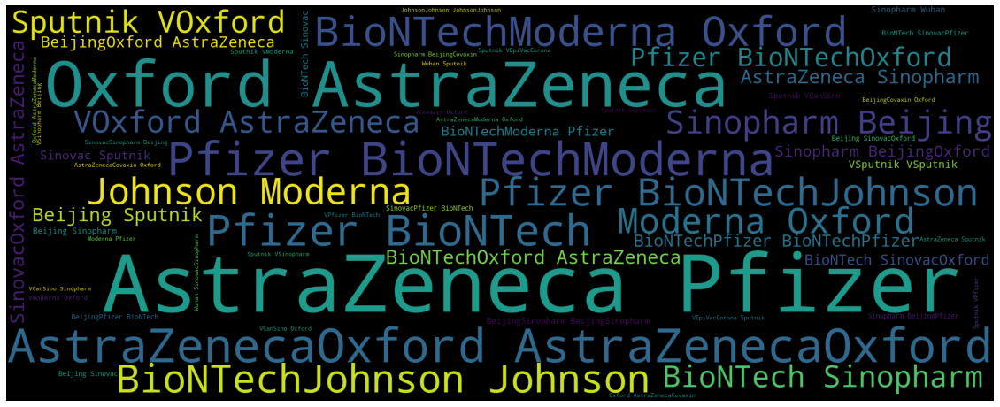

In [22]:
from wordcloud import WordCloud, STOPWORDS
plt.figure(figsize= (20,20))
words= "".join(country_vaccinations["vaccines"])
final = WordCloud(width = 2000, height = 800, background_color ="black",min_font_size = 10).generate(words)
plt.imshow(final)
plt.axis("off") 
plt.show()  

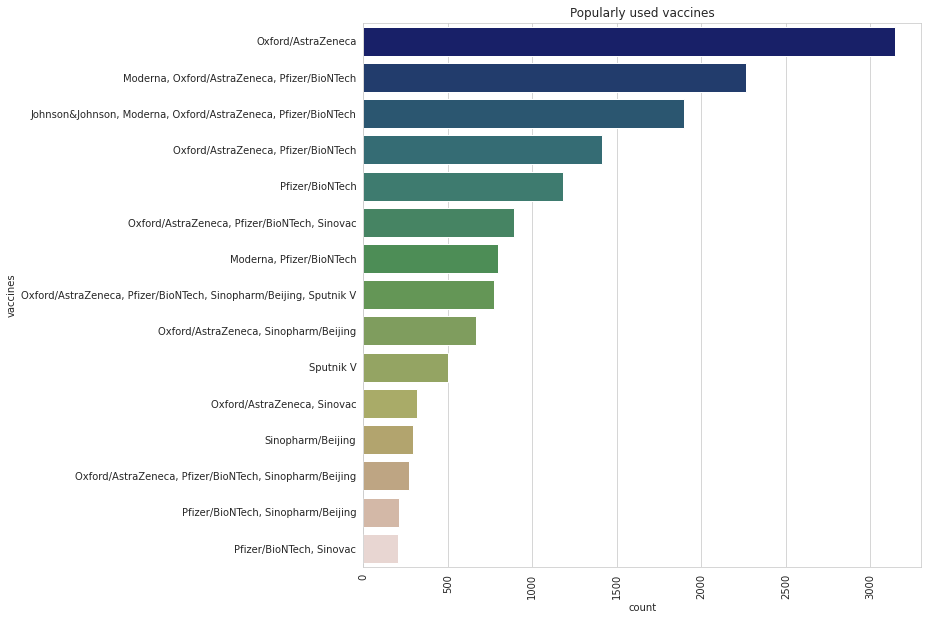

In [23]:
plt.figure(figsize=[10,10])
sns.countplot(y=country_vaccinations.vaccines,palette='gist_earth',
             order=country_vaccinations['vaccines'].value_counts().head(15).index)
plt.title("Popularly used vaccines")
plt.xticks(rotation=90);

# 6. Which country prefers what vaccine?

In [24]:
daily = country_vaccinations.loc[:,['country', 'date', 'vaccines', 'daily_vaccinations']].dropna(subset=['daily_vaccinations'])
daily["date"] = pd.to_datetime(daily["date"], format = '%Y-%m-%d')

daily_agg = daily.groupby('country').daily_vaccinations.agg(
    sum_vaccination_amt  = 'sum',
    mean_vaccination_amt = 'mean')


full_daily = daily.merge(daily_agg, on = 'country')
vaccines = full_daily.loc[:,['country', 'vaccines']]
vaccines = vaccines.groupby('vaccines')['country'].unique()
vaccines = pd.DataFrame(vaccines).reset_index()
vaccines

,vaccines,country
0,"CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[Mexico]
1,"CanSino, Sinopharm/Beijing, Sinovac, Sputnik V",[Pakistan]
2,"Covaxin, Oxford/AstraZeneca",[India]
3,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing","[Comoros, Mauritius]"
4,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing...",[Iran]
5,"EpiVacCorona, Sputnik V",[Russia]
6,Johnson&Johnson,[South Africa]
7,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...","[Austria, Belgium, Bulgaria, Czechia, France, ..."
8,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",[Libya]
9,"Johnson&Johnson, Moderna, Pfizer/BioNTech",[United States]


In [25]:

title = "Popular vaccines in countries"
data = full_daily
fig = px.choropleth(data, 
            locations="country", 
            locationmode='country names',
            color="vaccines", 
            hover_name="country",
                   title=title)


log_scale_vals = list(range(0,25,2))
scale_vals = (np.exp2(log_scale_vals)).astype(int).astype(str)



fig.update_layout(title_font_size=22,
                  margin={"r":20, "l":20},
                  coloraxis={#"showscale":False,
                            "colorbar":dict(title=title,
                                            #range=[np.log(50), np.log(6400)],
                                            titleside="top",
                                            tickmode="array",
                                            tickvals=log_scale_vals,
                                            ticktext=scale_vals
                                        )},
                 )

fig.show()

In [26]:
fig = px.treemap(full_daily,names = 'country',values = 'daily_vaccinations',path = ['vaccines','country'],
                 title="Daily Vaccinations per country grouped by Vaccines",
                 color_discrete_sequence =px.colors.qualitative.Set3)
fig.update_layout(
    margin=dict(l=10, r=10),
)
fig.show()

With the help of an interactive treemap and a chloropleth, I've made an attempt to visualize the preferred vaccines in the respective countries (the popular aspect included).

# Why vaccines can bring about a change?

To assure the efficacy of the vaccines, let's take into account a before-after scenario. 

Consider people fully vaccinated (per hundred) in the United State of America. 

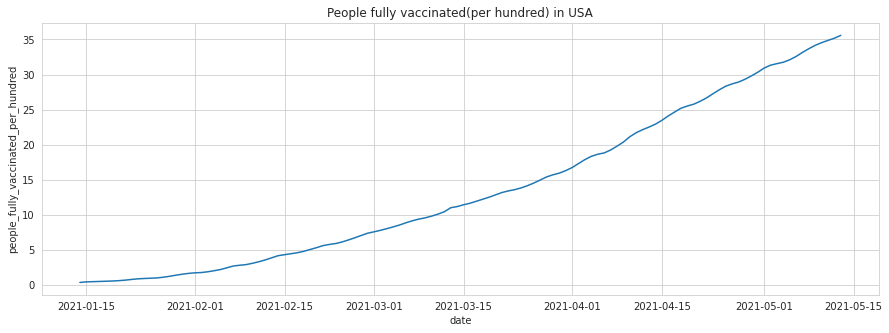

In [27]:
plt.figure(figsize= (15,5))

sns.lineplot(x= "date",y= "people_fully_vaccinated_per_hundred",data= country_vaccinations[country_vaccinations.country== "United States"])
plt.title("People fully vaccinated(per hundred) in USA")
plt.show()

From the choronologically arranged chloropleth, let's observe the number of cases on 15th Jan, 2021 and 1st May, 2021 and compare: 
We notice that the cases on 15th Jan, 2021 total to 8742806.
However, the cases take a nose dive to 6589842 as of 1st May, 2021 (aka after the administration of vaccines) 
Hence, there's definitely a reduction in the number of active cases. 

Let's consider another country to cement this observation well. Let's take UAE this time and follow the same steps.

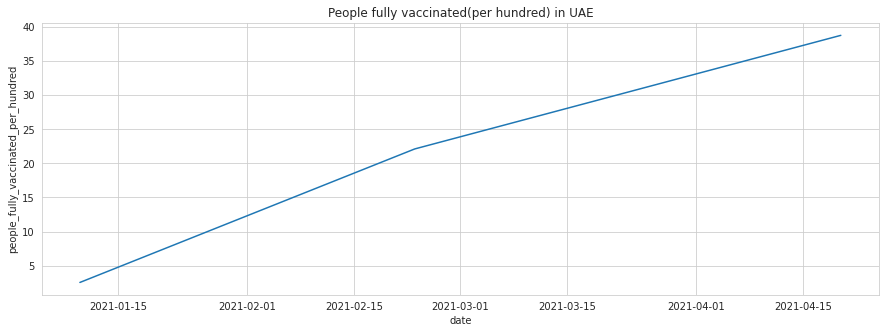

In [28]:
plt.figure(figsize= (15,5))

sns.lineplot(x= "date",y= "people_fully_vaccinated_per_hundred",data= country_vaccinations[country_vaccinations.country== "United Arab Emirates"])
plt.title("People fully vaccinated(per hundred) in UAE")
plt.show()

On 15th January, 2021, the active cases are about 26655.
As of 15th April, 2021, the number of active cases drop to 14866.
Once again, confirming the observation that yes, vaccines are efficient and they play a huge role in mitigating this spread of the virus.

# **A gist**

Special thanks to Sharlto for this amazing [resume chart](https://www.kaggle.com/dwin183287/covid-19-world-vaccination).

In [29]:
# Defining all our palette colours.
primary_blue = "#0068b6"
primary_blue2 = "#00b3ec"
primary_blue3 = "#3f4d63"
primary_grey = "#c6ccd8"
primary_grey2 = "#696969"
primary_black = "#202022"
primary_bgcolor = "#f4f0ea"

primary_green = px.colors.qualitative.Plotly[2]

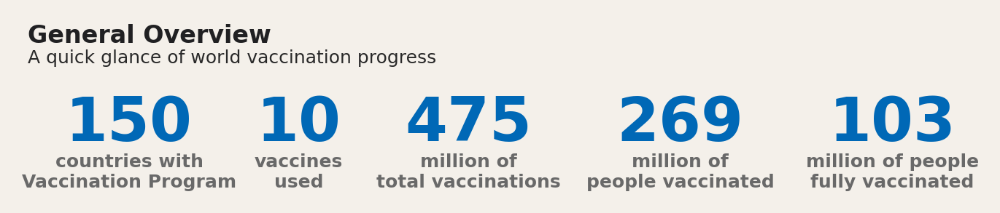

In [30]:
plt.rcParams['figure.dpi'] = 300

fig = plt.figure(figsize=(5, 0.8), facecolor='#f4f0ea')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0)

background_color = "#f4f0ea"

ax0 = fig.add_subplot(gs[0, 0])

ax0.set_facecolor(primary_bgcolor)
for s in ["top","right", 'left', 'bottom']:
    ax0.spines[s].set_visible(False)
ax0.set_xticks([])
ax0.set_yticks([])

ax0.text(-0.12, 0.8, 'General Overview', color=primary_black, fontsize=8, ha='left', weight='bold', va='bottom')
ax0.text(-0.12, 0.79, 'A quick glance of world vaccination progress', color='#292929', fontsize=6, ha='left', va='top')

ax0.text(0, 0, '150', color=primary_blue, fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0, 0, 'countries with\nVaccination Program', color=primary_grey2, fontsize=6, ha='center', va='top', weight='bold')

ax0.text(0.2, 0, '10', color=primary_blue, fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.2, 0, 'vaccines\nused', color=primary_grey2, fontsize=6, ha='center', va='top', weight='bold')

ax0.text(0.4, 0, '475', color=primary_blue, fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.4, 0, 'million of\ntotal vaccinations', color=primary_grey2, fontsize=6, ha='center', va='top', weight='bold')

ax0.text(0.65, 0, '269', color=primary_blue, fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.65, 0, 'million of\npeople vaccinated', color=primary_grey2, fontsize=6, ha='center', va='top', weight='bold')

ax0.text(0.9, 0, '103', color=primary_blue, fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.9, 0, 'million of people\nfully vaccinated', color=primary_grey2, fontsize=6, ha='center', va='top', weight='bold')

plt.show()

There's no way to tell how long the pandemic will continue. There are many factors, including the public’s efforts to slow the spread, researchers’ work to learn more about the virus, their search for a treatment, and the success of the vaccines. Remember, the best covid vaccine is the one available to you. So, wait for your chance and go take a shot! Help others get others and convince them in all the ways you possibly can. Wear a mask (even if you're fully vaccinated), use sanitizers and I'm guessing by now, you know the drill! Hoping to see the end point in sight, let's bring this virus down, together!

Thank you for reading this far. All your opinions are welcome! 